# Notebook for feature matching

This note book runs through some sample images and finds a feature in an image (test image) based on an example image (query image). 


In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# make matplotlib figures appear inline in the notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

# Query Image and Test images
The images are all of a target 8x11 chessboard taken from various orientations and settings

In [ ]:
image_filenames = [
    '20170730_124407.jpg',
    '20170729_183549.jpg',
    '20170729_183557.jpg',
    '20170729_183559.jpg',
    '20170729_183602.jpg',
    '20170729_183706.jpg',
    '20170729_183710.jpg',
    '20170729_183712.jpg',
    '20170729_183721.jpg',
    '20170729_183728.jpg'
]

query_img = '20170729_181119.jpg';


def load_images():
    # Read some images
    images = []
    for filename in image_filenames:
        img = cv2.imread(filename)
        images.append(img)
    return images

# plot the raw images
images = load_images()
cols = 2
rows = (len(images) / cols) + 1
for i in range(len(images)):
    plt.title(image_filenames[i])
    plt.imshow(images[i])
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    


# Feature matching ORB

See http://docs.opencv.org/3.1.0/d1/d89/tutorial_py_orb.html

Start by looking at keypoints from the query image (the chessboard only) and some of the test images


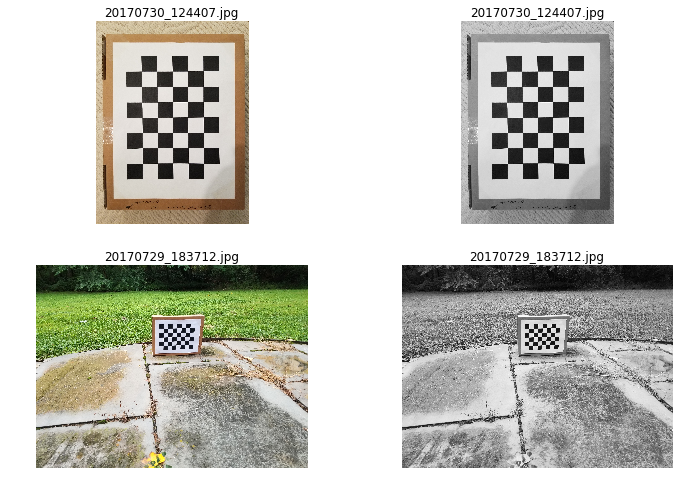

In [32]:
#convert to grayscale

query_img_name = '20170730_124407.jpg'
test_img_name = '20170729_183712.jpg'
query_img = images[0]
test_img = images[7]
# use gray images
query_img_gray = cv2.cvtColor(query_img, cv2.COLOR_BGR2GRAY)
test_img_gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)

plt.subplot(2, 2, 1)
plt.title(image_filenames[0])
plt.imshow(cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2,  2)
plt.title(image_filenames[0])
plt.imshow(query_img_gray)
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title(image_filenames[7])
plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title(image_filenames[7])
plt.imshow(test_img_gray)
plt.axis('off')

plt.show()


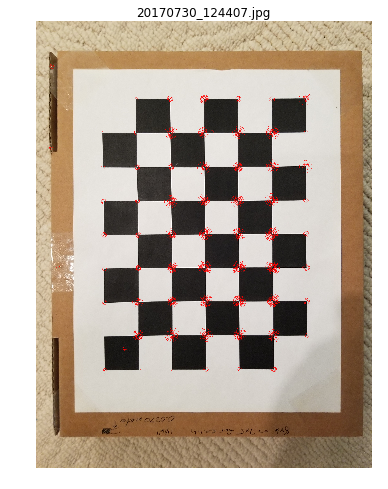

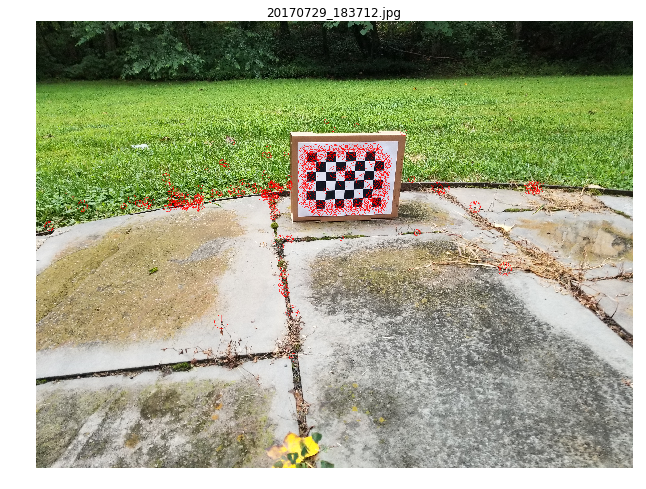

In [33]:
# detect keypoints

orb = cv2.ORB_create()
query_kp, query_features = orb.detectAndCompute(query_img_gray, None)
test_kp, test_features = orb.detectAndCompute(test_img_gray, None)
query_img_kp = cv2.drawKeypoints(query_img, query_kp, None, color=(0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
test_img_kp = cv2.drawKeypoints(test_img, test_kp, None, color=(0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.title(image_filenames[0])
plt.imshow(cv2.cvtColor(query_img_kp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

plt.title(image_filenames[7])
plt.imshow(cv2.cvtColor(test_img_kp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


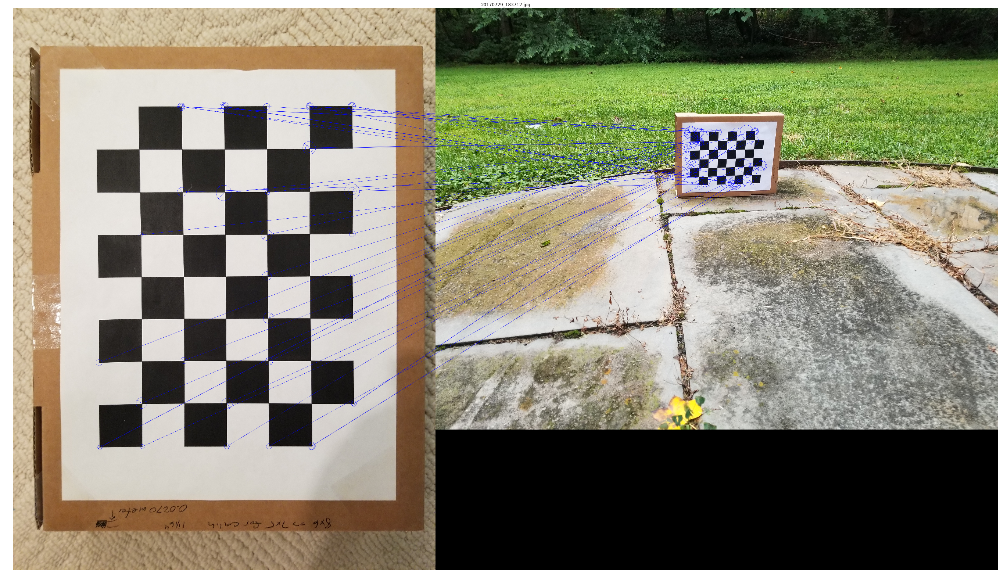

In [34]:
# Calculate matching points
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
matches = bf.match(query_features, test_features)
matches = sorted(matches, key = lambda x:x.distance)
MATCHES = 40
reatined_matches = matches[:MATCHES]
draw_params = dict(
    matchColor = (255, 0, 0),
    singlePointColor = (0, 0, 255),
    matchesMask = None, 
    flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS | cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
    #    flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS )
match_img = cv2.drawMatches(query_img, query_kp, test_img, test_kp, reatined_matches, None, **draw_params)

plt.figure(figsize=(48, 32))
plt.title(image_filenames[7])
plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


pst [[[    0.     0.]]

 [[    0.  3023.]]

 [[ 4031.  3023.]]

 [[ 4031.     0.]]]
dst [[[ 1891.67614746   961.8883667 ]]

 [[ 1890.21325684   962.2208252 ]]

 [[ 1891.10131836   961.78381348]]

 [[ 1888.79907227   963.29785156]]]


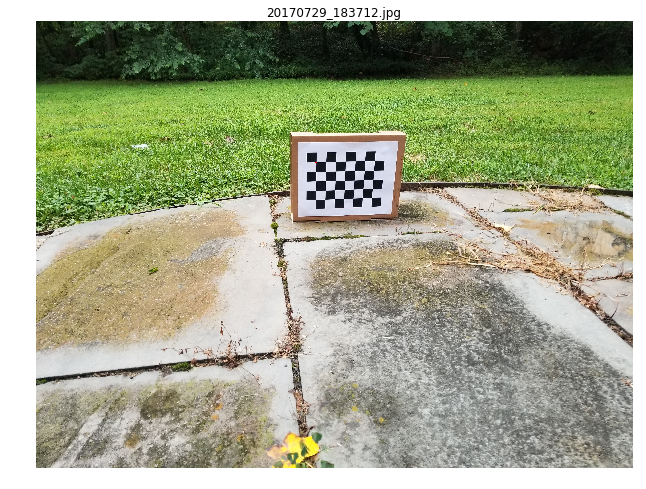

In [15]:
# Create Homography and use it to project query image onto test image 

# Not working!!

src_pts = np.float32([ query_kp[m.queryIdx].pt for m in reatined_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ test_kp[m.trainIdx].pt for m in reatined_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
matchesMask = mask.ravel().tolist()
w, h = query_img.shape[:2]
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
print "pst", pts
dst = cv2.perspectiveTransform(pts,M)
print "dst", dst
test_img_query_overlay = cv2.polylines(test_img,[np.int32(dst)],True, (0, 0, 255), 10)

plt.title(image_filenames[7])
plt.imshow(cv2.cvtColor(test_img_query_overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
